<a href="https://colab.research.google.com/github/sktmbtkr01/Dog-vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!unzip "/content/drive/MyDrive/dog-vision/dog-breed-identification (1).zip" -d "/content/drive/MyDrive/dog-vision/"


Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/dog-vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/dog-vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/dog-vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/dog-vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/dog-vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/dog-vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/dog-vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/dog-vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/MyDrive/dog-vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/drive/MyDrive/dog-vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: /content/drive/M

In [ ]:
!ls "/content/drive/MyDrive/dog-vision/"

'dog-breed-identification (1).zip'   sample_submission.csv   train
 labels.csv			     test


In [ ]:
!ls "/content/drive/MyDrive/dog-vision/train" | head
!find "/content/drive/MyDrive/dog-vision/train" -type f | wc -l

^C
10222


In [ ]:
!find "/content/drive/MyDrive/dog-vision/train" -type f | wc -l
!find "/content/drive/MyDrive/dog-vision/test" -type f | wc -l

10222
10357


# End to end Multi-class Dog Breed CLassification
This notebook builds an end to end multi class image classifier using TensorFlow 2.0 and TensorFlow

# Get our workspace ready

* Import TesnorFlow
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
import os
os.environ["TF_USE_LEGACY_KERAS"] = "1"   # must be set BEFORE importing TF/Keras

import tensorflow as tf
import tensorflow_hub as hub
import keras
import sys

print("tf      :", tf.__version__)
print("keras   :", keras.__version__)        # should now show a 2.x style version (legacy)
print("hub     :", hub.__version__)
print("keras pkg imported? ->", "keras" in sys.modules)

tf      : 2.19.0
keras   : 3.10.0
hub     : 0.16.1
keras pkg imported? -> True


In [ ]:
# Import TensorFlow into colab
import os
os.environ["TF_USE_LEGACY_KERAS"] = "1"  # must be set before importing TF/Keras

import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("TF version:", hub.__version__)

#Check for GPU availability
print("GPU","available(YESSSSS)" if tf.config.list_physical_devices("GPU")else "not available:")


TF version: 2.19.0
TF version: 0.16.1
GPU available(YESSSSS)


In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

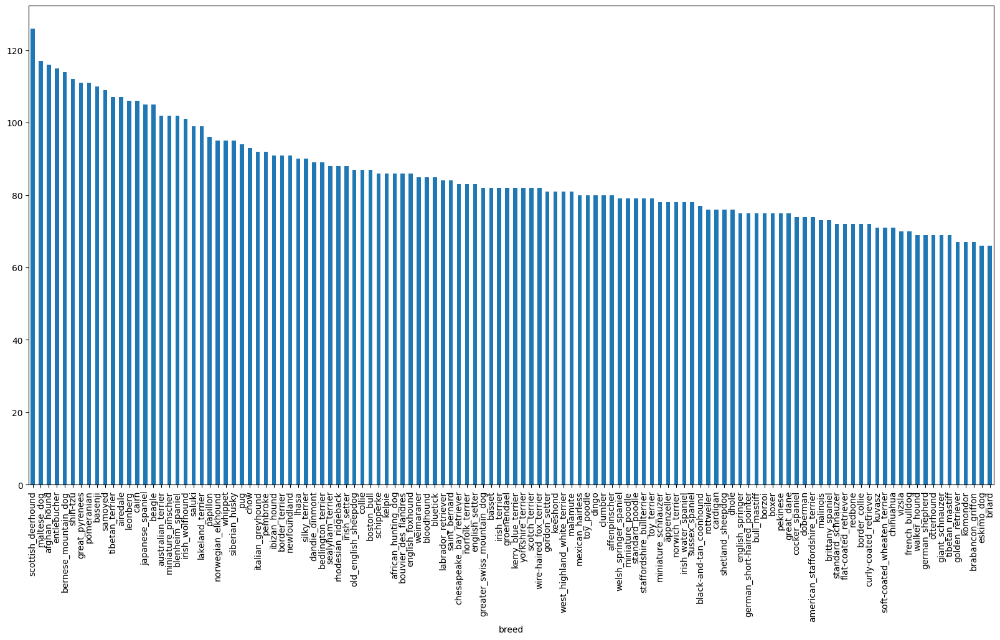

In [ ]:
 labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

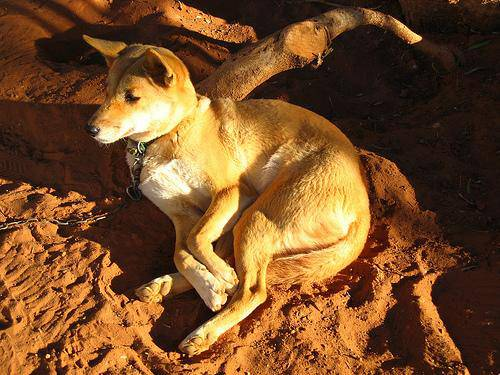

In [ ]:
#lets view an image
from IPython.display import Image
Image("drive/My Drive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and their labels
Lets get a list of all our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames = ["drive/My Drive/dog-vision/train/" +fname +".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/My Drive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/dog-vision/train/"))== len(filenames):
  print("Filesnames match actual amount of files")
else:
  print("Filenames do not match ")

Filesnames match actual amount of files


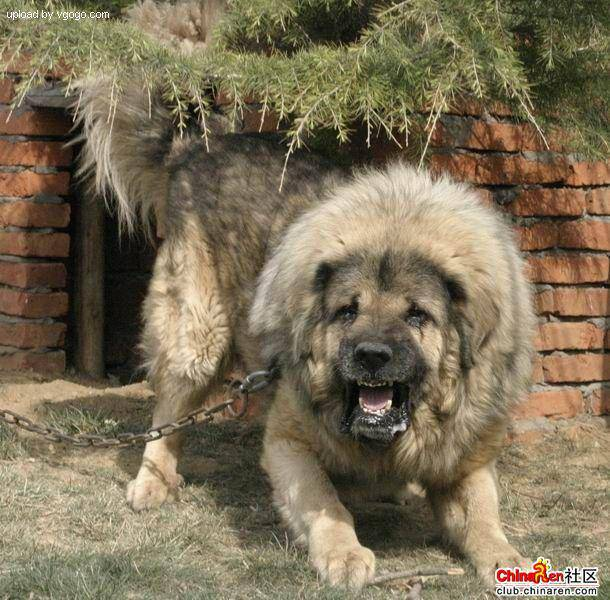

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, lets prepare our labels

In [ ]:
import numpy as np
labels=labels_csv["breed"]
labels= np.array(labels)
labels
len(labels)

10222

In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turn every label into a boolean array
boolean_labels = [label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# example : turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds ==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[2]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
filenames[:10]

['drive/My Drive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creating our own validation set
Since the dataset from kaggle dosent come with a validation set, we are going to create our own

In [ ]:
# Setup X and y
X= filenames
y= boolean_labels

we re going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {"type": "slider", "min": 1000, "max": 10000, "step": 1000}


In [ ]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split
#split
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                            y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
# Lets have a geez at the training data
X_train[:5],y_train[:2]

(['drive/My Drive/dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/dog-vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/dog-vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/dog-vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing images (turning images into tensors)
To preprocess our images into tensors we are going to write a fn which does a few things
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a  vairable, 'image'
3. Turn our 'image' into tensors
4. Normalize our image (convert color channels values from 0-255 to 0-2)
5. Resize the image to be a shape
6. Return the modified image

In [ ]:
# Convert image to NumPy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Define image size
IMG_SIZE = 224
# Create a fn for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns into a Tensor
  """
  #read an image file
  image = tf.io.read_file(image_path)
  #turn thr jpeg image into numerical tensor with 3 colour channels(RGB)
  image=tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 (makes computing on it more efficient)
  image = tf.image.convert_image_dtype(image,tf.float32)
  #resize the image to our desired value(224.224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

In [ ]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor = tf.image.decode_jpeg(tensor,channels=3)

In [ ]:
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

## turning our data into batches

Why turn our data into batches?

Lets say you are trying to preocess 10+ images in one go...they all might not fit into memory.

So thats why we do about 32(this is the batch size) image at a time.

In order to use TensorFlow effectively, we need out data i the form of Tensor tuples



In [ ]:
# Create a simple functioon to return a tuple (image,label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image,label

In [ ]:
#Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we ve got a way to turnour data into tuples of tensors in the form (image,label), lets make a fn to turn all of our data (x&y) into batches!

In [ ]:
#Define the batch size
BATCH_SIZE=32
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  if test_data:
    print("Creating test data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating validation data batches..")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) # Pass both X and y
    data_batch= data.map(get_image_label).batch(BATCH_SIZE)
    return  data_batch
  else:
    print("Creating training data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)


Creating training data batches..
Creating validation data batches..


In [ ]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt
#Create a fn for viewing images in a data batch
def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


To make computation efficient, a batch is a tighly wound collection of Tensors.

So to view data in a batch, we've got to unwind it.

We can do so by calling the as_numpy_iterator() method on a data batch.

This will turn our a data batch into something which can be iterated over.

Passing an iterable to next() will return the next item in the iterator.

In our case, next will return a batch of 32 images and label pairs.

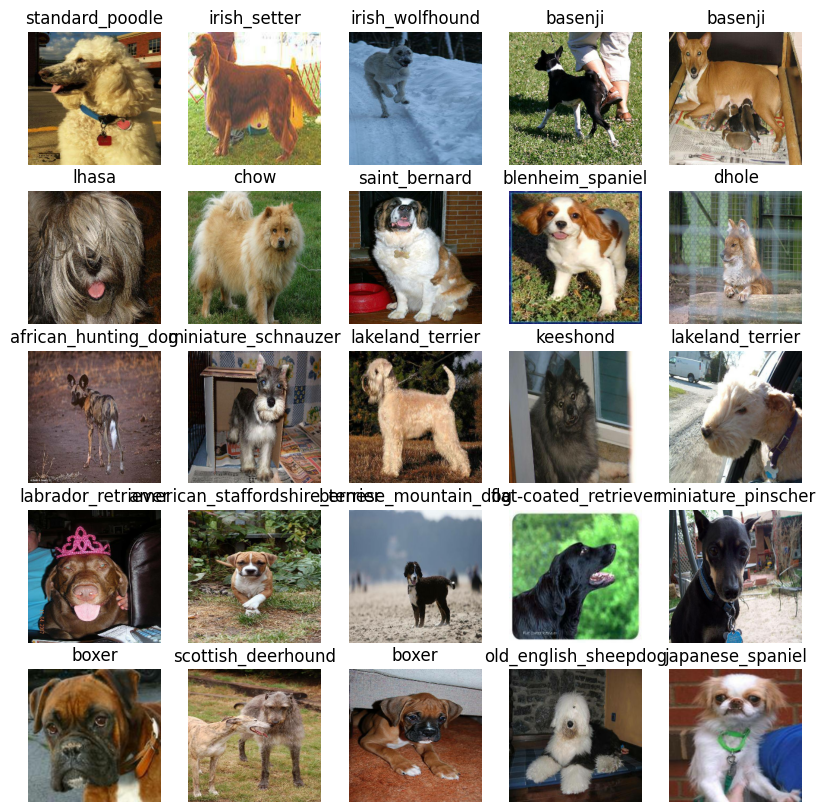

In [ ]:
#visualize training images from the training data batch
train_images,train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

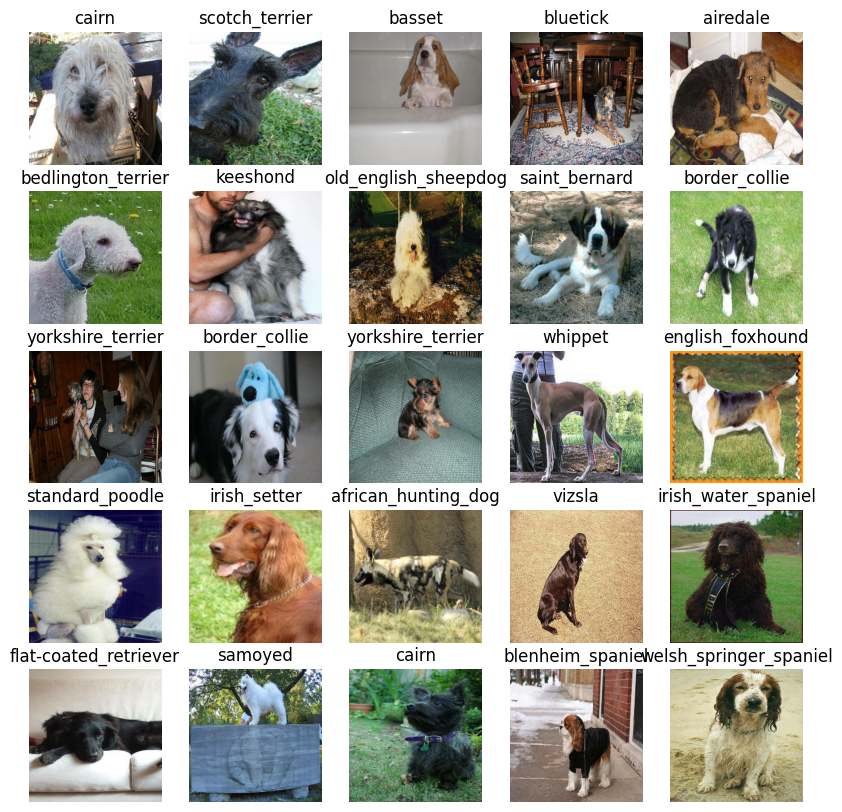

In [ ]:
# validation data batch
val_images,val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of tensors)
* The URL of the model we want to use

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [IMG_SIZE,IMG_SIZE,3]
#Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)
#setup model URL from TensorFlow Hub
MODEL_URL ="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5"

Now we ve got our inputs, outputs and model ready to go.
Lets put them together into a Keras deep Learning model

Knowing this, lets create a function which:

* Takes the input shape, output shape and the model we ve chosen as parameters.
* Defines the layers in a Keras model in sequential fashion(do this first, then this, then that)
* Compiles the model(says it should be evaluasted and improved).
* Builds the model(tells the model the input shape it will be getting)
* Returns the model.

In [ ]:
def create_model(input_shape= INPUT_SHAPE, output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:", model_url)
  #setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url,input_shape=input_shape),
      tf.keras.layers.Dense(units=output_shape,
                            activation="softmax")
  ])
  #comile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  #build the model
  model.build(input_shape)
  return model

In [ ]:
model2=create_model()
model2.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1664)              3766048   
                                                                 
 dense (Dense)               (None, 120)               199800    
                                                                 
Total params: 3965848 (15.13 MB)
Trainable params: 199800 (780.47 KB)
Non-trainable params: 3766048 (14.37 MB)
_________________________________________________________________


## Creating callbacks
Callbacks are helper fn a model can use during training to do such things as save its progress,check its progres sor stop training early if a model stops improving

We ll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model for training too long

##TensorBoard Callback
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to out models fit() fn.
3. Visualize our models training and logs with the %tensorboard magic fn (we'll' do this after model training)/

In [ ]:
# Load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
#Create a fn to build a TensorBoard callback
def create_tensorboard_callback():
  #create a log dir for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/dog-vision/logs",
                        #Make it so the logs get tracked whenever we run an exp
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## TensorBoard early stopping callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops

In [ ]:
#Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

our first model is only going to train on 1000 images, to make sure everything is alright

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

epochs = no of chances giving our model to go through the data

Lets create a fn which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() fn on our model passing it the training data, validate data, number of epochs to train for (nUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a fn to train and return a trained model
def train_model():
  """
  Train a given model and returns the trained version.
  """
  #Create a model
  model=create_model()
  #Create new TensorBoard session everytime we traina model
  tensorboard = create_tensorboard_callback()
  #Fit the model to the data passing it the callback we creates
  model.fit(x=train_data,
            epochs= NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model


In [ ]:
#Fit the model to the data
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5
Epoch 1/100
25/25 [==============================] - 191s 7s/step - loss: 4.2827 - accuracy: 0.1462 - val_loss: 3.1950 - val_accuracy: 0.3600
Epoch 2/100
25/25 [==============================] - 4s 137ms/step - loss: 1.4584 - accuracy: 0.7713 - val_loss: 1.8794 - val_accuracy: 0.6000
Epoch 3/100
25/25 [==============================] - 3s 133ms/step - loss: 0.5348 - accuracy: 0.9525 - val_loss: 1.4807 - val_accuracy: 0.6550
Epoch 4/100
25/25 [==============================] - 4s 159ms/step - loss: 0.2671 - accuracy: 0.9912 - val_loss: 1.3437 - val_accuracy: 0.7300
Epoch 5/100
25/25 [==============================] - 4s 178ms/step - loss: 0.1672 - accuracy: 0.9975 - val_loss: 1.2897 - val_accuracy: 0.7150
Epoch 6/100
25/25 [==============================] - 3s 135ms/step - loss: 0.1189 - accuracy: 1.0000 - val_loss: 1.2454 - val_accuracy: 0.7200
Epoch 7/100
25/25 [==============================]

**note** : overfitting to begin with is a good thing

## checking the tensorboard logs
The TensorBoard magic functio ('%tensorboard') will access the logs directory we created earlier and visualize its content.

In [ ]:
%tensorboard --logdir drive/My\ Drive/dog-vision/logs

Reusing TensorBoard on port 6006 (pid 2328), started 0:05:14 ago. (Use '!kill 2328' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = loaded_1000_image_model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 30s 5s/step


array([[1.6483727e-03, 2.4706274e-04, 1.0606461e-03, ..., 1.7546811e-04,
        6.6170054e-05, 1.7757509e-03],
       [6.7544617e-03, 2.1191374e-03, 1.4169167e-02, ..., 1.7394875e-03,
        7.2052842e-03, 6.6711078e-04],
       [1.5685739e-04, 3.9321755e-04, 6.6632224e-04, ..., 5.0301634e-04,
        6.7374793e-05, 3.3264607e-03],
       ...,
       [1.6288348e-05, 5.0528761e-04, 1.1215892e-03, ..., 2.2654446e-04,
        1.5181913e-04, 2.3843170e-04],
       [1.1306658e-02, 3.4453766e-04, 2.7003369e-04, ..., 6.5766735e-04,
        7.3054034e-05, 6.3371994e-03],
       [2.6137329e-04, 3.2964341e-05, 8.0127118e-04, ..., 3.1352134e-03,
        5.9175078e-04, 9.2552058e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# this is the associated probability for every breed
predictions[0]

array([1.64837274e-03, 2.47062737e-04, 1.06064614e-03, 1.69829160e-04,
       5.02480369e-04, 4.25102644e-06, 2.14107912e-02, 4.90760838e-04,
       4.00869285e-05, 1.15023002e-04, 6.14867604e-05, 6.60039295e-05,
       1.24944027e-05, 4.00309582e-05, 1.93667642e-04, 1.35308233e-04,
       3.61978232e-06, 2.13577271e-01, 8.27047279e-06, 1.16201809e-05,
       1.06645492e-03, 2.35277950e-03, 1.09128187e-05, 2.23197276e-03,
       2.63173170e-05, 3.57511235e-05, 3.77760619e-01, 3.64004591e-05,
       4.86918492e-04, 6.66658627e-04, 1.49393658e-04, 1.44410494e-03,
       1.64904501e-04, 1.05154431e-05, 1.13334485e-04, 1.80952977e-02,
       7.05297498e-05, 2.16644243e-04, 2.89918462e-05, 4.96676730e-05,
       2.98729370e-04, 2.19556041e-05, 1.55095098e-04, 7.64913711e-05,
       1.58224611e-05, 2.55567338e-05, 1.84720102e-05, 1.22623998e-04,
       1.21395628e-04, 3.27116490e-04, 2.42445585e-05, 2.54024799e-05,
       3.66293383e-03, 8.86989255e-06, 7.39794923e-05, 3.15431407e-06,
      

In [ ]:
np.sum(predictions[0])

np.float32(1.0)

In [ ]:
#first prediction
index=42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.51853630e-05 2.03427713e-04 1.96514316e-04 1.31794252e-04
 4.27160040e-03 1.72693472e-04 1.96196735e-04 4.33839485e-03
 5.67202903e-02 4.58527878e-02 1.40031407e-05 8.72651799e-05
 3.06843896e-04 8.62640236e-03 3.89629579e-03 3.91584868e-03
 2.85560527e-05 4.03802114e-04 8.53389356e-05 3.33379081e-04
 4.46202830e-05 2.55921367e-03 8.62194720e-05 7.32574408e-05
 1.21589079e-02 9.06940186e-05 4.09972126e-05 7.62754644e-04
 3.18668026e-04 1.17373042e-04 6.83068938e-05 1.79006325e-04
 3.22179723e-04 3.42055537e-05 1.41150071e-04 3.17289014e-05
 2.93440040e-04 3.06685484e-04 2.03573465e-04 1.73048064e-01
 3.79757723e-04 4.74738154e-05 4.12725843e-03 1.66389582e-05
 2.19433816e-04 3.28250244e-05 1.48368330e-04 7.12034584e-04
 6.07819275e-05 6.24315464e-04 1.52633584e-04 9.23296378e-04
 6.47514069e-04 3.56731866e-03 3.14857680e-05 1.56114146e-03
 2.17537483e-04 1.73405919e-04 1.90319224e-05 8.64000685e-05
 8.11877311e-04 1.54713169e-04 2.18759833e-05 9.70699766e-05
 4.43879071e-05 2.197633

Having the above functionality is great but we want to be able to do it as scale.
And it would be even better if we could see the image the prediction is made on!

**Note:** Predictions probabilities are also known as confidence levels.

In [ ]:
# Turn predictions into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]
#Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[42])
pred_label

'walker_hound'

Now since our validation data is still in a batch dataset,
we will have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation label (truth label)

In [ ]:
# Create a fn to unbatch a datset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns seperate arrays of images and labels
  """
  images=[]
  labels=[]
  # loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
#unbatchify the val data
val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* prediction labels
* validation labels(truth labels)
* validation images

Lets make some fn to make these all a b it more visualize

We will create a fn which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels,images,n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]
  #Get the pred label
  pred_label = get_pred_label(pred_prob)
  #Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  #colour
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  #Change the plot title to be predicted,probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

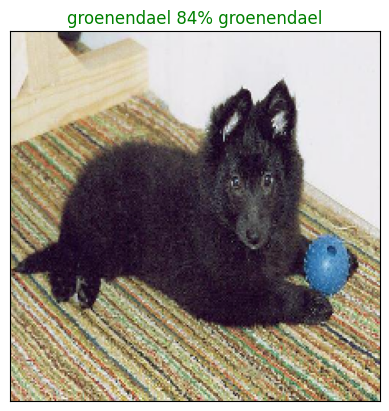

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)


Now we ve got one fn to visualize our models top prediction, lets make another to view our models top 10 predictions

This fn will:
* Take an input of prediction probabilities array and a ground truth array and an interger
* Find the prediction using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, colouring the true label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")
  #Change the color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass



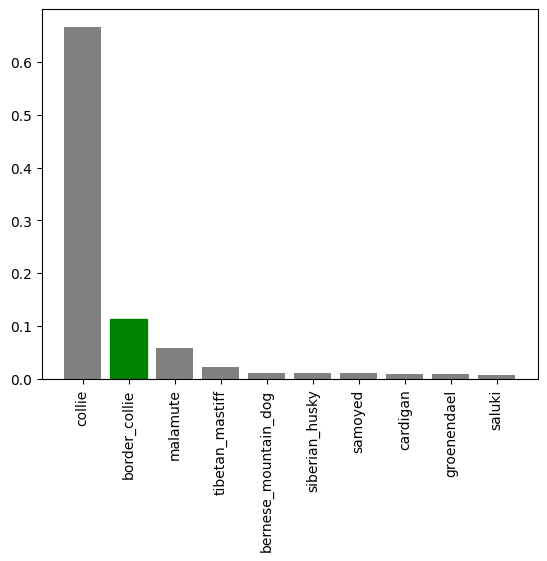

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we ve got some fn to help us visualize our predictions and evaluate out modle, lets check out a few.


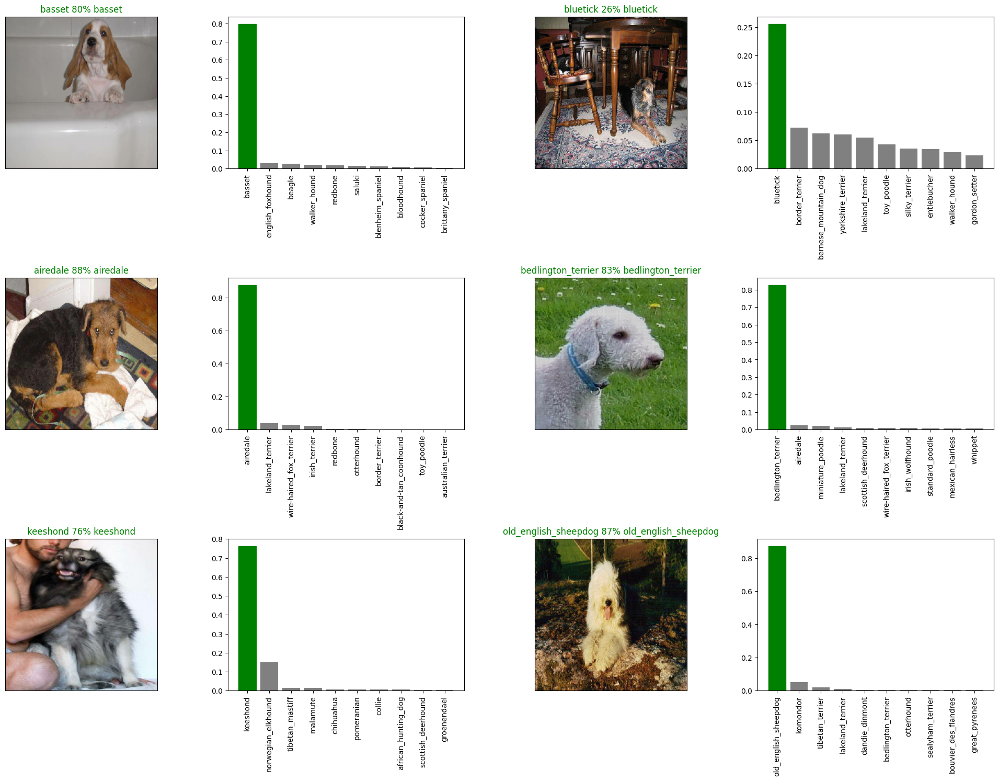

In [ ]:
#Lets check out a few predictions and their different values
i_multiplier = 2
num_rows = 3
num_cols=2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(pad=1.0)
plt.show()


## Saving and reloading our model

In [ ]:
# Create a fn to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  #Create a model directory pathname with current time
  modeldir=os.path.join("drive/My Drive/dog-vision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix+".h5" #save format of the model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a fn to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  return model



Now we ve got fn to save and load a trained model, lets make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix = "1000-images-mobilenetv2-skt2")


Saving model to: drive/My Drive/dog-vision/models/20250910-151527-1000-images-mobilenetv2-skt2.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/dog-vision/models/20250910-151527-1000-images-mobilenetv2-skt2.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/My Drive/dog-vision/models/20250908-135349-1000-images-mobilenetv2-skt2.h5")

Loading saved model from: drive/My Drive/dog-vision/models/20250908-135349-1000-images-mobilenetv2-skt2.h5


In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 89ms/step - loss: 1.1992 - accuracy: 0.6850


[1.199225902557373, 0.6850000023841858]

In [ ]:
model.evaluate(val_data)

NameError: name 'model' is not defined

## Training a big dog model (on the full data)

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)

Creating training data batches..


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5


In [ ]:
# Create a full model callbacks
full_model_tensorboard = create_tensorboard_callback()
#No validation set when training on all the data, we cant monitor validation acc
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30minutes for the first epoch) because the GPU we re using in the runtime has to load all of the images into memory.

Hence we first trained it on 1000 images to make sure everything is workign

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs = NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3905s 12s/step - loss: 1.2642 - accuracy: 0.6884
Epoch 2/100
320/320 [==============================] - 39s 123ms/step - loss: 0.3806 - accuracy: 0.8928
Epoch 3/100
320/320 [==============================] - 39s 122ms/step - loss: 0.2258 - accuracy: 0.9428
Epoch 4/100
320/320 [==============================] - 39s 122ms/step - loss: 0.1465 - accuracy: 0.9689
Epoch 5/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0979 - accuracy: 0.9856
Epoch 6/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0697 - accuracy: 0.9926
Epoch 7/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0517 - accuracy: 0.9952
Epoch 8/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0403 - accuracy: 0.9973
Epoch 9/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0315 - accuracy: 0.9982
Epoch 10/100
320/320 [==============================] - 39s 123m

In [ ]:
save_model(full_model,suffix = "full-image-set-mobilenetv2-skt-big-dog")

Saving model to: drive/My Drive/dog-vision/models/20250908-153257-full-image-set-mobilenetv2-skt-big-dog.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/dog-vision/models/20250908-153257-full-image-set-mobilenetv2-skt-big-dog.h5'

In [ ]:
loaded_full_model =load_model("drive/My Drive/dog-vision/models/20250908-153257-full-image-set-mobilenetv2-skt-big-dog.h5")

Loading saved model from: drive/My Drive/dog-vision/models/20250908-153257-full-image-set-mobilenetv2-skt-big-dog.h5


## Making predictions on the test dataset
Since our model has been trained on images in the form of tensor batches to make predictions on the test data, we will have to get it into the same format.

Luckily we created 'create_Data_batches()' earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data we will:
* Get the test image filenames
* Convert the filenames into test data batches using 'create_data_batches()' and settung the 'test_data' parameter to 'True' (since the test data dosent have labels).
* Make predictions array by passing the test batches to the predict() method called on our model


In [ ]:
# Load test image filenames
test_path ="drive/MyDrive/dog-vision/test"
test_filenames = [test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog-vision/teste021107c3f07749e5f5b389e57e21ded.jpg',
 'drive/MyDrive/dog-vision/teste6cbd88414627be43910a1977ce28595.jpg',
 'drive/MyDrive/dog-vision/teste46f65254fdf01d5fe732068c844efbd.jpg',
 'drive/MyDrive/dog-vision/teste302e1c88252f91357e62b8fd340f2d1.jpg',
 'drive/MyDrive/dog-vision/testddf48fc0d3f0719c40332708c331a9ab.jpg',
 'drive/MyDrive/dog-vision/teste6223aba45a94c9ac349967ed946d0f7.jpg',
 'drive/MyDrive/dog-vision/testdeb063345bf2b6752e2fe25cad096547.jpg',
 'drive/MyDrive/dog-vision/testdfe03aa0ae066e09cdda6e7f6e08390a.jpg',
 'drive/MyDrive/dog-vision/teste5657f523cf994628f63b673c88e9112.jpg',
 'drive/MyDrive/dog-vision/teste6343c835d2d07d7f3ac962b92415743.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches..


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** 'Calling predict()' on our full model and passing it the test data batch will take a long time to run

## Should have run the below cell but will take a lot of time so importing the preds_array.csv directly

In [ ]:
# Make predictions on test data batch using loaded full model
#test_predictions = loaded_full_model.predict(test_data, verbose=1)

In [ ]:
test_predictions = np.genfromtxt("drive/MyDrive/dog-vision/preds_array.csv",
                                 delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.61196489e-09, 3.44086413e-12, 2.32834394e-11, ...,
        1.06917716e-13, 1.58530451e-08, 1.52161670e-06],
       [3.17894322e-10, 3.20088262e-14, 1.85374840e-10, ...,
        7.00588814e-08, 1.88822238e-08, 2.56980937e-10],
       [4.27301083e-09, 1.84139528e-13, 1.11784948e-09, ...,
        2.71949238e-12, 2.23927123e-06, 7.41860809e-11],
       ...,
       [4.47232779e-10, 4.28004029e-07, 4.11986996e-08, ...,
        4.65437893e-07, 8.21722967e-10, 8.86002116e-09],
       [3.50528079e-11, 1.94377336e-03, 1.44941642e-10, ...,
        1.56135718e-06, 6.13228721e-08, 7.32120961e-12],
       [1.23221771e-08, 3.08354520e-09, 1.87174110e-10, ...,
        8.16165635e-10, 9.98905063e-01, 6.73740752e-09]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test DataSet for Kaggle submission

Looking at Kaggle sample submission, we find that it wants our model prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

In [ ]:
# Creata a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] +list(unique_breeds))

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e021107c3f07749e5f5b389e57e21ded,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e6cbd88414627be43910a1977ce28595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e46f65254fdf01d5fe732068c844efbd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e302e1c88252f91357e62b8fd340f2d1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ddf48fc0d3f0719c40332708c331a9ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e021107c3f07749e5f5b389e57e21ded,1.611965e-09,3.440864e-12,2.328344e-11,1.407994e-12,5.980330e-09,2.145339e-11,5.328517e-10,1.764934e-10,4.491057e-11,...,8.200658e-09,4.056766e-08,2.202154e-11,3.074556e-12,7.080598e-12,3.024534e-09,2.991727e-07,1.069177e-13,1.585305e-08,1.521617e-06
1,e6cbd88414627be43910a1977ce28595,3.178943e-10,3.200883e-14,1.853748e-10,1.954662e-13,8.682216e-07,3.362278e-07,2.264711e-06,9.995926e-01,1.876677e-10,...,3.441671e-07,1.129437e-04,6.675200e-09,1.690707e-06,6.804413e-10,5.923428e-09,5.574148e-09,7.005888e-08,1.888222e-08,2.569809e-10
2,e46f65254fdf01d5fe732068c844efbd,4.273011e-09,1.841395e-13,1.117849e-09,1.106639e-10,7.225005e-11,1.169239e-05,7.223256e-07,5.553372e-04,9.785655e-11,...,3.530463e-09,4.605002e-05,9.586189e-12,2.740325e-08,8.798643e-12,2.793681e-08,1.502214e-07,2.719492e-12,2.239271e-06,7.418608e-11
3,e302e1c88252f91357e62b8fd340f2d1,5.227723e-14,3.371553e-14,1.638175e-11,5.283554e-12,7.160043e-08,1.832600e-13,6.625124e-13,1.087913e-13,8.482403e-11,...,5.968796e-12,1.492889e-13,2.230498e-06,4.158368e-10,9.999646e-01,3.224581e-13,1.426521e-11,2.974644e-12,8.130380e-13,6.134530e-11
4,ddf48fc0d3f0719c40332708c331a9ab,9.613753e-11,1.304277e-08,1.246931e-08,1.478856e-07,6.658420e-09,6.374474e-12,2.422878e-05,4.128350e-09,1.767556e-04,...,1.207746e-06,2.052871e-08,6.508744e-13,2.080402e-10,1.428936e-09,5.703394e-08,1.541623e-06,2.052792e-05,3.110282e-04,1.318874e-06


In [ ]:
preds_df.to_csv("drive/My Drive/dog-vision/full_model_prediction_submission_1.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images we will:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using 'create_data_batches()'. and since our custom images wont have labels, we set the test_data param to True.as_integer_ratio
* Pass the custom image data batch to our model to make predictions.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted label to custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/dog-vision/dogpics/" # Added forward slash here
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/dog-vision/dogpics/pic1.jpg',
 'drive/MyDrive/dog-vision/dogpics/pic2.jpg',
 'drive/MyDrive/dog-vision/dogpics/pic3.jpg']

In [ ]:
#Turn custom images into batch datasets
custom_data= create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches..


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
## Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['boxer', 'german_shepherd', 'malamute']

In [ ]:
custom_images=[]
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

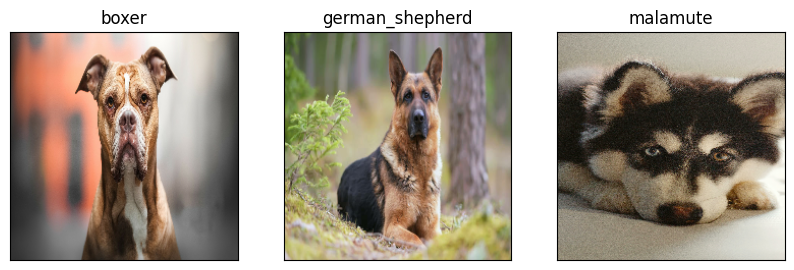

In [ ]:
#check custom predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)